In [58]:
import pandas as pd
import plotly.express as px
import numpy as np 
import plotly.graph_objects as go
import json

In [59]:
space = pd.read_csv('SPACE.csv')

Hello! This is an attempt at me trying to clean my data, which was my first milestone. 

In [60]:
space.head()

,name,distance,stellar_magnitude,planet_type,discovery_year,mass_multiplier,mass_wrt,radius_multiplier,radius_wrt,orbital_radius,orbital_period,eccentricity,detection_method
0,11 Comae Berenices b,304.0,4.72307,Gas Giant,2007,19.40000,Jupiter,1.08,Jupiter,1.290000,0.892539,0.23,Radial Velocity
1,11 Ursae Minoris b,409.0,5.01300,Gas Giant,2009,14.74000,Jupiter,1.09,Jupiter,1.530000,1.400000,0.08,Radial Velocity
2,14 Andromedae b,246.0,5.23133,Gas Giant,2008,4.80000,Jupiter,1.15,Jupiter,0.830000,0.508693,0.00,Radial Velocity
3,14 Herculis b,58.0,6.61935,Gas Giant,2002,8.13881,Jupiter,1.12,Jupiter,2.773069,4.800000,0.37,Radial Velocity
4,16 Cygni B b,69.0,6.21500,Gas Giant,1996,1.78000,Jupiter,1.20,Jupiter,1.660000,2.200000,0.68,Radial Velocity


counting the total of empty cells

In [61]:
empty_cells_count = space.isnull().sum().sum()
print(f'Number of empty cells: {empty_cells_count}')

Number of empty cells: 547


I tried to figure out how many emplty cells there were 

In [62]:
space.isnull().sum()

name                   0
distance              17
stellar_magnitude    161
planet_type            0
discovery_year         0
mass_multiplier       23
mass_wrt              23
radius_multiplier     17
radius_wrt            17
orbital_radius       289
orbital_period         0
eccentricity           0
detection_method       0
dtype: int64

In [63]:
space.shape

(5250, 13)

Figured out another way to find the rows and columns of a set

In [64]:
print(space.columns)


Index(['name', 'distance', 'stellar_magnitude', 'planet_type',
       'discovery_year', 'mass_multiplier', 'mass_wrt', 'radius_multiplier',
       'radius_wrt', 'orbital_radius', 'orbital_period', 'eccentricity',
       'detection_method'],
      dtype='object')


I took a look at all the possible columns and decided to discard the ones that weren't super useful

In [65]:
columns_to_keep = [
    'name', 'distance', 'mass_multiplier', 'mass_wrt', 'radius_multiplier', 
    'radius_wrt', 'orbital_radius', 'orbital_period', 'eccentricity', 
    'discovery_year', 'detection_method', 'planet_type'
]

space_filtered = space[columns_to_keep]
print(space_filtered.head())

                   name  distance  mass_multiplier mass_wrt  \
0  11 Comae Berenices b     304.0         19.40000  Jupiter   
1    11 Ursae Minoris b     409.0         14.74000  Jupiter   
2       14 Andromedae b     246.0          4.80000  Jupiter   
3         14 Herculis b      58.0          8.13881  Jupiter   
4          16 Cygni B b      69.0          1.78000  Jupiter   

   radius_multiplier radius_wrt  orbital_radius  orbital_period  eccentricity  \
0               1.08    Jupiter        1.290000        0.892539          0.23   
1               1.09    Jupiter        1.530000        1.400000          0.08   
2               1.15    Jupiter        0.830000        0.508693          0.00   
3               1.12    Jupiter        2.773069        4.800000          0.37   
4               1.20    Jupiter        1.660000        2.200000          0.68   

   discovery_year detection_method planet_type  
0            2007  Radial Velocity   Gas Giant  
1            2009  Radial Velocity  

In [66]:
space_filtered.shape

(5250, 12)

In [67]:
space_filtered.isnull().sum()

name                   0
distance              17
mass_multiplier       23
mass_wrt              23
radius_multiplier     17
radius_wrt            17
orbital_radius       289
orbital_period         0
eccentricity           0
discovery_year         0
detection_method       0
planet_type            0
dtype: int64

removed even more columns and added back the ones I could make interesting graphs out of

In [68]:
columns_to_keep = [
    'name', 'distance', 'mass_multiplier', 'mass_wrt', 'radius_multiplier', 'planet_type', 
    'radius_wrt', 'orbital_period', 'eccentricity', 
    'discovery_year', 'detection_method'
]

space_filtered = space[columns_to_keep]
print(space_filtered.head())

                   name  distance  mass_multiplier mass_wrt  \
0  11 Comae Berenices b     304.0         19.40000  Jupiter   
1    11 Ursae Minoris b     409.0         14.74000  Jupiter   
2       14 Andromedae b     246.0          4.80000  Jupiter   
3         14 Herculis b      58.0          8.13881  Jupiter   
4          16 Cygni B b      69.0          1.78000  Jupiter   

   radius_multiplier planet_type radius_wrt  orbital_period  eccentricity  \
0               1.08   Gas Giant    Jupiter        0.892539          0.23   
1               1.09   Gas Giant    Jupiter        1.400000          0.08   
2               1.15   Gas Giant    Jupiter        0.508693          0.00   
3               1.12   Gas Giant    Jupiter        4.800000          0.37   
4               1.20   Gas Giant    Jupiter        2.200000          0.68   

   discovery_year detection_method  
0            2007  Radial Velocity  
1            2009  Radial Velocity  
2            2008  Radial Velocity  
3         

In [69]:
space_filtered.isnull().sum()

name                  0
distance             17
mass_multiplier      23
mass_wrt             23
radius_multiplier    17
planet_type           0
radius_wrt           17
orbital_period        0
eccentricity          0
discovery_year        0
detection_method      0
dtype: int64

turning the nas into medians 

In [70]:
space_filtered = space_filtered.fillna(space_filtered.median(numeric_only=True))
space_filtered.head()

,name,distance,mass_multiplier,mass_wrt,radius_multiplier,planet_type,radius_wrt,orbital_period,eccentricity,discovery_year,detection_method
0,11 Comae Berenices b,304.0,19.40000,Jupiter,1.08,Gas Giant,Jupiter,0.892539,0.23,2007,Radial Velocity
1,11 Ursae Minoris b,409.0,14.74000,Jupiter,1.09,Gas Giant,Jupiter,1.400000,0.08,2009,Radial Velocity
2,14 Andromedae b,246.0,4.80000,Jupiter,1.15,Gas Giant,Jupiter,0.508693,0.00,2008,Radial Velocity
3,14 Herculis b,58.0,8.13881,Jupiter,1.12,Gas Giant,Jupiter,4.800000,0.37,2002,Radial Velocity
4,16 Cygni B b,69.0,1.78000,Jupiter,1.20,Gas Giant,Jupiter,2.200000,0.68,1996,Radial Velocity


In [71]:
space_filtered.isnull().sum()

name                  0
distance              0
mass_multiplier       0
mass_wrt             23
radius_multiplier     0
planet_type           0
radius_wrt           17
orbital_period        0
eccentricity          0
discovery_year        0
detection_method      0
dtype: int64

for some reason I couldn't get rid of the nulls in the two values above, and I fif the following the fix that

In [72]:
space_filtered = space_filtered.dropna(subset=['mass_wrt', 'radius_wrt'])
space_filtered.isnull().sum()

name                 0
distance             0
mass_multiplier      0
mass_wrt             0
radius_multiplier    0
planet_type          0
radius_wrt           0
orbital_period       0
eccentricity         0
discovery_year       0
detection_method     0
dtype: int64

In [73]:
space_filtered = space_filtered.drop_duplicates()
print(space_filtered.info())

<class 'pandas.core.frame.DataFrame'>
Index: 5215 entries, 0 to 5249
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               5215 non-null   object 
 1   distance           5215 non-null   float64
 2   mass_multiplier    5215 non-null   float64
 3   mass_wrt           5215 non-null   object 
 4   radius_multiplier  5215 non-null   float64
 5   planet_type        5215 non-null   object 
 6   radius_wrt         5215 non-null   object 
 7   orbital_period     5215 non-null   float64
 8   eccentricity       5215 non-null   float64
 9   discovery_year     5215 non-null   int64  
 10  detection_method   5215 non-null   object 
dtypes: float64(5), int64(1), object(5)
memory usage: 488.9+ KB
None


At this point, I would like to visualize and theoretically create my own planet to understand all these parameters for myself. My planet's name is planty, which is the mean distance away from planet earth. After this activity, I was able to understand the relevance of each column.

In [74]:
np.mean(space_filtered['mass_multiplier'])

6.438975748801533

In [75]:
np.mean(space_filtered['radius_multiplier'])

1.014785426653883

I scoured through the plotly example sets and found the scatter 3d to be my favourite for this project. 

In [76]:
space_distance = space_filtered[['name', 'distance', 'mass_multiplier']]
space_distance

,name,distance,mass_multiplier
0,11 Comae Berenices b,304.0,19.40000
1,11 Ursae Minoris b,409.0,14.74000
2,14 Andromedae b,246.0,4.80000
3,14 Herculis b,58.0,8.13881
4,16 Cygni B b,69.0,1.78000
...,...,...,...
5245,XO-7 b,764.0,0.70900
5246,YSES 2 b,357.0,6.30000
5247,YZ Ceti b,12.0,0.70000
5248,YZ Ceti c,12.0,1.14000


Here I was just messing around with grouping cartain variables to see how the plot would look

In [77]:
fig = px.scatter_3d(space_distance, x='name', y='distance', z='mass_multiplier',
                    color='mass_multiplier', title='3D Scatter Plot of Exoplanet Distance and Mass')
fig.show()

Interesting but they're all sitting on the floor 

In [78]:
space_discovery = space_filtered[['name', 'discovery_year', 'distance']]
space_discovery

,name,discovery_year,distance
0,11 Comae Berenices b,2007,304.0
1,11 Ursae Minoris b,2009,409.0
2,14 Andromedae b,2008,246.0
3,14 Herculis b,2002,58.0
4,16 Cygni B b,1996,69.0
...,...,...,...
5245,XO-7 b,2019,764.0
5246,YSES 2 b,2021,357.0
5247,YZ Ceti b,2017,12.0
5248,YZ Ceti c,2017,12.0


In [79]:
fig = px.scatter_3d(space_discovery, x='name', y='distance', z='discovery_year',
                    color='discovery_year', title='3D Scatter Plot of Exoplanet discovery and distance')
fig.update_layout(title=dict(text='Plot'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

Interesting but they're making a box like boundary. I don't think my 3d thinking skills are the best

In [80]:
fig = px.scatter_3d(space_discovery, x='name', y='discovery_year', z='distance', 
                    color='discovery_year', title='3D Scatter Plot of Exoplanet discovery and distance')

fig.show()

In [81]:
planet_type_count = space['planet_type'].nunique()
print(planet_type_count)

5


In [82]:
unique_items = space['planet_type'].drop_duplicates()

print(unique_items)

0          Gas Giant
30       Super Earth
32      Neptune-like
137      Terrestrial
4474         Unknown
Name: planet_type, dtype: object


In [83]:
orbital_radius_avg = space['orbital_radius'].nunique()
print(orbital_radius_avg)

2827


In [84]:
fig = px.scatter_3d(space_filtered, x='distance', y='mass_multiplier', z='discovery_year',
                    color='discovery_year', title='3D Scatter Plot of Exoplanet discovery, mass and distance')
fig.update_layout(title=dict(text='Distance, mass, year'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.write_html("wordpress_upload.html")

fig.show()

That did not work, why didn't that work? The mass multiplier on the outlier is 752, drastically bigger than the rest of the planets. Interesting. Which planet is this and why is it so MASSIVE!

In [85]:
planet_name = space[space['mass_multiplier'] == 752]['name'].iloc[0]
print(planet_name)

HD 100546 b


In [86]:
planet_row = space[space['mass_multiplier'] == 752].iloc[0]
print(planet_row)

name                    HD 100546 b
distance                      358.0
stellar_magnitude              6.69
planet_type               Gas Giant
discovery_year                 2014
mass_multiplier               752.0
mass_wrt                    Jupiter
radius_multiplier               6.9
radius_wrt                  Jupiter
orbital_radius                 53.0
orbital_period                249.2
eccentricity                    0.0
detection_method     Direct Imaging
Name: 466, dtype: object


I was pretty satisfied at this point and decided to submit the notebook

In [87]:
planet_name = space[space['mass_multiplier'] == 144]['name'].iloc[0]
print(planet_name)

K2-52 b


Following is just me trying to look up different planets and their properties. Also I was facinated to see how you can figure out the name of the planet with just its location, gotta love pandas

In [88]:
planet_row = space[space['name'] == 'K2-52 b'].iloc[0]
print(planet_row)


name                   K2-52 b
distance                3387.0
stellar_magnitude        15.93
planet_type          Gas Giant
discovery_year            2016
mass_multiplier          144.0
mass_wrt               Jupiter
radius_multiplier        1.606
radius_wrt             Jupiter
orbital_radius           0.054
orbital_period        0.009582
eccentricity               0.0
detection_method       Transit
Name: 1704, dtype: object


In [89]:
planet_latest = space[space['discovery_year'] == 2023].iloc[0]
print(planet_latest)

name                       GJ 1151 c
distance                        26.0
stellar_magnitude              13.76
planet_type             Neptune-like
discovery_year                  2023
mass_multiplier                10.62
mass_wrt                       Earth
radius_multiplier               0.29
radius_wrt                   Jupiter
orbital_radius                0.5714
orbital_period               1.06694
eccentricity                     0.0
detection_method     Radial Velocity
Name: 200, dtype: object


In [90]:
planet_latest = space[space['discovery_year'] == 2023]
planet_latest_count = len(planet_latest)
planet_latest_count 

9

In [91]:
planet_latest_name = space[space['discovery_year'] == 2023]['name']
print(planet_latest_name)


200      GJ 1151 c
4861    TOI-1669 b
4866    TOI-1694 b
4867    TOI-1694 c
4951    TOI-4342 b
4952    TOI-4342 c
4957    TOI-4562 b
4958    TOI-4582 b
4990     TOI-700 e
Name: name, dtype: object


In [92]:
planet_latest_name = space[space['discovery_year'] == 2022]['name']
print(planet_latest_name)


43          AB Aurigae b
110           CoRoT-35 b
111           CoRoT-36 b
118            CoRoT-7 d
153     EPIC 206317286 c
              ...       
5000           TOI-833 b
5008           TOI-969 b
5009           TOI-969 c
5025    TYC 2187-512-1 b
5076          WASP-132 c
Name: name, Length: 338, dtype: object


In [93]:
planet_latest = space[space['discovery_year'] == 2022]
planet_latest_count = len(planet_latest)
planet_latest_count 

338

In [94]:
planet_latest = space[space['discovery_year'] == 2021]
planet_latest_count = len(planet_latest)
planet_latest_count 

525

In [95]:
yearly_discoveries = space.groupby('discovery_year').size()

max_discoveries_year = yearly_discoveries.idxmax()
max_discoveries_count = yearly_discoveries.max()

print(f"The year with the highest number of discoveries is {max_discoveries_year}, with {max_discoveries_count} discoveries.")


The year with the highest number of discoveries is 2016, with 1517 discoveries.


I saw this template on the plotly library, but never understoof how to place my values in it, so it's just an effort in vain

In [96]:
fig = go.Figure(data=[go.Surface(z=space.values)])

fig.update_layout(title=dict(text='Mt Bruno Elevation'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

There was something happening in 2016. They discovered 1517 exoplanets. I'm tyring to look up what were these events that took place, but I can't find much. The following line graph shows the hike in planet discovery. 

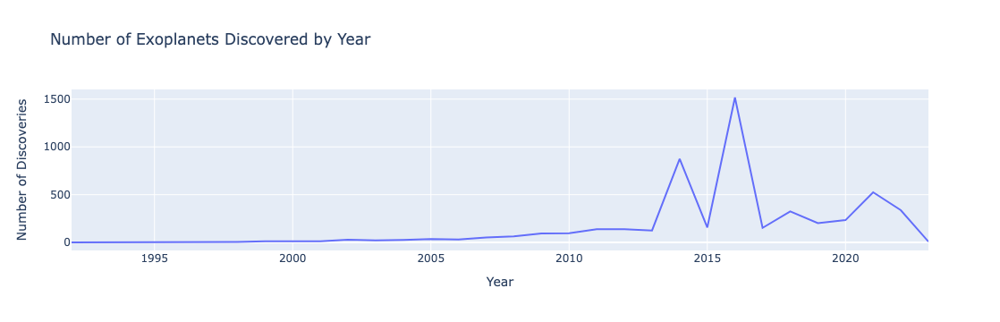

In [97]:

yearly_discoveries = space.groupby('discovery_year').size().reset_index(name='num_discoveries')

fig = px.line(
    yearly_discoveries, 
    x='discovery_year', 
    y='num_discoveries', 
    title='Number of Exoplanets Discovered by Year', 
    labels={'discovery_year': 'Year', 'num_discoveries': 'Number of Discoveries'}
)

fig.show()


space = px.data.gapminder()
px.scatter(space, x="distance", y="mass_multiplier", animation_frame="discovery_year", animation_group="name",
           size="pop", color="planet_type", hover_name="name",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

df = px.data.gapminder()
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

Up here I was trying to make an animated plot, but it didn't work

I was running into a problem at this point, becuase I wanted the data points to be evenly scattered in an explorable way. The problem was that I was always placing values that had less variables.

In [98]:
fig = px.scatter_3d(space_filtered, x='mass_wrt', y='discovery_year', z='distance',
                    color='distance', title='3D Scatter Plot of Exoplanet discovery, mass and distance')
fig.update_layout(title=dict(text='Distance, mass, year'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.write_html("wordpress_upload.html")

fig.show()

name                    HD 100546 b
distance                      358.0
stellar_magnitude              6.69
planet_type               Gas Giant
discovery_year                 2014
mass_multiplier               752.0
mass_wrt                    Jupiter
radius_multiplier               6.9
radius_wrt                  Jupiter
orbital_radius                 53.0
orbital_period                249.2
eccentricity                    0.0
detection_method     Direct Imaging
Name: 466, dtype: object

In [99]:
fig = px.scatter_3d(space_filtered, x='orbital_period', y='discovery_year', z='distance',
                    color='distance', title='3D Scatter Plot of Exoplanet discovery, mass and distance')
fig.update_layout(title=dict(text='Distance, mass, year'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.write_html("wordpress_upload.html")

fig.show()

This was so dissatisfying to see 

In [100]:
planet_latest = space[space['distance'] == 36].iloc[0]
print(planet_latest)

name                   COCONUTS-2 b
distance                       36.0
stellar_magnitude            11.298
planet_type               Gas Giant
discovery_year                 2021
mass_multiplier                 6.3
mass_wrt                    Jupiter
radius_multiplier              1.11
radius_wrt                  Jupiter
orbital_radius               7506.0
orbital_period            1101369.9
eccentricity                    0.0
detection_method     Direct Imaging
Name: 84, dtype: object


I summoned all the keys again and started drawing 3d cubes in my notebook thinking of what could look right. I needed it to look 3d

In [101]:
fig = px.scatter_3d(space_filtered, x='orbital_period', y='discovery_year', z='distance',
                    color='distance', title='3D Scatter Plot of Exoplanet discovery, mass and distance')
fig.update_layout(title=dict(text='Distance, mass, year'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.write_html("wordpress_upload.html")

fig.show()

In [102]:
fig = px.scatter_3d(space_filtered, x='orbital_period', y='discovery_year', z='distance',
                    color='distance', title='3D Scatter Plot of Exoplanet discovery, mass and distance')
fig.update_layout(title=dict(text='Distance, mass, year'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.write_html("wordpress_upload.html")

fig.show()

In [103]:
fig = px.scatter_3d(space_filtered, x='distance', y='discovery_year', z='radius_multiplier',
                    color='planet_type', title='3D Scatter Plot of Exoplanet discovery, mass and distance')
fig.update_layout(title=dict(text='Distance, mass, year'), autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.write_html("wordpress_upload.html")

fig.show()

Okay, I was gettint closer, but this just looked like crayons melted together. I used radius multiplier as the z axis, which would give an indication of the planet's size without makitn it too linear or 2d!

In [104]:
fig = px.scatter_3d(
    space_filtered,
    x='distance', 
    y='discovery_year', 
    z='radius_multiplier',
    color='planet_type',
    size='radius_multiplier', 
    title='3D Scatter Plot of Exoplanet Discovery, Mass, and Distance'
)

fig.update_layout(
    title=dict(text='Distance, Mass, Year'),
    autosize=False,
    width=500,
    height=500,
    margin=dict(l=65, r=50, b=65, t=90)
)

fig.show()
fig.write_html("3d_scatter_plot.html")


And I ended up here, a crisp view of all the planets - zoomable and super indicative of their many qualities. I was satisfied at this point.


In [105]:
import plotly.express as px

fig = px.scatter_3d(
    space_filtered,
    x='distance', 
    y='discovery_year', 
    z='radius_multiplier',
    color='planet_type',
    size='radius_multiplier',
    hover_name='name',  
    title='3D Scatter Plot of Exoplanet Discovery, Mass, and Distance'
)

fig.update_layout(
    title=dict(
        text='Exoplanet Discoveries in 3D Space',
        font=dict(size=20, color='darkblue'),
    ),
    scene=dict(
        xaxis_title='Distance (light-years)',
        yaxis_title='Discovery Year',
        zaxis_title='Radius Multiplier',
        xaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
        yaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
        zaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
    ),
    autosize=True, 
    width=800, 
    height=800, 
    margin=dict(l=50, r=50, b=50, t=100),  
    template="plotly_dark"  
)

fig.update_traces(
    marker=dict(
        opacity=0.8, 
        line=dict(width=1, color='darkgrey')  
    )
)

fig.show()
fig.write_html("3d_scatter_plot.html")


In [106]:
import plotly.express as px

fig = px.scatter_3d(
    space_filtered,
    x='distance',
    y='radius_multiplier',  
    z='discovery_year',  
    color='planet_type',
    size='radius_multiplier',
    hover_name='name', 
    title='Exoplanet Discoveries: Size, Distance, and Time'
)

fig.update_layout(
    title=dict(
        text='Exoplanet Discoveries: Size, Distance, and Time',
        font=dict(size=20, color='darkblue'),
    ),
    scene=dict(
        xaxis_title='Distance (log scale, light-years)',
        xaxis=dict(
            type='log',  
            backgroundcolor="lightgrey", 
            gridcolor="white",
            title_font=dict(size=14)
        ),
        yaxis_title='Relative Radius (Earth = 1)',
        yaxis=dict(
            backgroundcolor="lightgrey", 
            gridcolor="white",
            title_font=dict(size=14)
        ),
        zaxis_title='Discovery Year',
        zaxis=dict(
            backgroundcolor="lightgrey", 
            gridcolor="white",
            title_font=dict(size=14)
        )
    ),
    autosize=True,
    width=800,
    height=800,
    margin=dict(l=50, r=50, b=50, t=100),
    template="plotly_dark"
)

fig.update_traces(
    marker=dict(
        opacity=0.8,
        line=dict(width=1, color='darkgrey')
    )
)

fig.show()
fig.write_html("3d_scatter_plot.html")


In [107]:
import plotly.express as px

fig = px.scatter_3d(
    space_filtered,
    x='distance', 
    y='radius_multiplier', 
    z='discovery_year',
    color='planet_type',
    size='radius_multiplier',
    hover_name='name',  
    hover_data={
        'mass_multiplier': True, 
        'orbital_period': True  
    },
    title='Exoplanet Discoveries: Size, Distance, and Time',
    color_discrete_sequence=px.colors.qualitative.Set2  
)

fig.update_layout(
    title=dict(
        text='Exoplanet Discoveries: Size, Distance, and Time',
        font=dict(size=20, color='midnightblue'),
    ),
    scene=dict(
        xaxis_title='Distance (log scale, light-years)',
        xaxis=dict(
            type='log',
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        yaxis_title='Relative Radius (Earth = 1)',
        yaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        zaxis_title='Discovery Year',
        zaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        )
    ),
    autosize=True,
    width=1000,
    height=800,
    margin=dict(l=50, r=50, b=50, t=100),
    template="plotly_white",  
)

fig.update_layout(
    scene_camera=dict(
        eye=dict(x=2, y=1.5, z=1.2)  
    )
)

fig.update_traces(
    marker=dict(
        opacity=0.85,
        line=dict(width=1.5, color='darkgrey')
    )
)

fig.show()
fig.write_html("3d_scatter_plot_enhanced.html")


At this point I was getting comfortable with the aesthetics of it, but thelog scale bothered me because of the uneven patterns although it showed a beautifully scattered plot. I removed it so the scatter effect shrank but it was even atleast. 

In [108]:
import plotly.express as px
import json

fig = px.scatter_3d(
    space_filtered,
    x='distance', 
    y='radius_multiplier', 
    z='discovery_year',
    color='planet_type',
    size='radius_multiplier',
    hover_name='name',  
    hover_data={
        'mass_multiplier': True, 
        'orbital_period': True  
    },
    title='Exoplanet Discoveries: Size, Distance, and Time',
    color_discrete_sequence=px.colors.qualitative.Set2  
)

fig.update_layout(
    title=dict(
        text='Exoplanet Discoveries: Size, Distance, and Time',
        font=dict(size=20, color='midnightblue'),
    ),
    scene=dict(
        xaxis_title='Distance (log scale, light-years)',
        xaxis=dict(
            type='log',
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        yaxis_title='Relative Radius (Earth = 1)',
        yaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        zaxis_title='Discovery Year',
        zaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        )
    ),
    autosize=True,
    width=1000,
    height=800,
    margin=dict(l=50, r=50, b=50, t=100),
    template="plotly_white",  
)

fig.update_layout(
    scene_camera=dict(
        eye=dict(x=2, y=1.5, z=1.2)  
    )
)

fig.update_traces(
    marker=dict(
        opacity=0.85,
        line=dict(width=1.5, color='darkgrey')
    )
)

fig_dict = fig.to_dict()

def convert_ndarrays(d):
    if isinstance(d, dict):
        return {k: convert_ndarrays(v) for k, v in d.items()}
    elif isinstance(d, list):
        return [convert_ndarrays(i) for i in d]
    elif isinstance(d, np.ndarray):  
        return d.tolist()
    return d

fig_dict_serializable = convert_ndarrays(fig_dict)

with open('plotly_3d_scatter_data.json', 'w') as json_file:
    json.dump(fig_dict_serializable, json_file)

fig.show()


You will see me try to make jsons everywhere. I was trying to get them on my VR headset, for which json was helpful It even worked, but not in a truly 3d sense. It worked like a desktop would, interactive but still 2d in a sense. 

In [109]:
import plotly.express as px
import json

fig = px.scatter_3d(
    space_filtered,
    x='distance', 
    y='radius_multiplier', 
    z='discovery_year',
    color='planet_type',
    size='radius_multiplier',
    hover_name='name',  
    hover_data={
        'mass_multiplier': True, 
        'orbital_period': True  
    },
    title='Exoplanet Discoveries: Size, Distance, and Time',
    color_discrete_sequence=px.colors.qualitative.Set2  
)

fig.update_layout(
    title=dict(
        text='Exoplanet Discoveries: Size, Distance, and Time',
        font=dict(size=20, color='midnightblue'),
    ),
    scene=dict(
        xaxis_title='Distance (light-years)', 
        xaxis=dict(
            type='linear',  
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        yaxis_title='Relative Radius (Earth = 1)',
        yaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        zaxis_title='Discovery Year',
        zaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        )
    ),
    autosize=True,
    width=1000,
    height=800,
    margin=dict(l=50, r=50, b=50, t=100),
    template="plotly_white",  
)

fig.update_layout(
    scene_camera=dict(
        eye=dict(x=2, y=1.5, z=1.2)  
    )
)

fig.update_traces(
    marker=dict(
        opacity=0.85,
        line=dict(width=1.5, color='darkgrey')
    )
)

fig_dict = fig.to_dict()

def convert_ndarrays(d):
    if isinstance(d, dict):
        return {k: convert_ndarrays(v) for k, v in d.items()}
    elif isinstance(d, list):
        return [convert_ndarrays(i) for i in d]
    elif isinstance(d, np.ndarray): 
        return d.tolist()
    return d

fig_dict_serializable = convert_ndarrays(fig_dict)

with open('SPACE STUFF.json', 'w') as json_file:
    json.dump(fig_dict_serializable, json_file)

fig.show()

fig.update_layout(
    scene=dict(
        xaxis_title='Distance (light-years)',  
        xaxis=dict(
            type='linear', 
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14),
            autorange='reversed'
        ),
        yaxis_title='Relative Radius (Earth = 1)',
        yaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        zaxis_title='Discovery Year',
        zaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        )
    ),
    autosize=True,
    width=1000,
    height=800,
    margin=dict(l=50, r=50, b=50, t=100),
    template="plotly_white",  
)




In [112]:
import plotly.express as px
import json
import numpy as np 

fig = px.scatter_3d(
    space_filtered,
    x='distance', 
    y='radius_multiplier', 
    z='discovery_year',
    color='planet_type',
    size='radius_multiplier',
    hover_name='name',  
    hover_data={
        'mass_multiplier': True, 
        'orbital_period': True  
    },
    title='Exoplanet Discoveries: Size, Distance, and Time',
    color_discrete_sequence=px.colors.qualitative.Set2,
    labels={'planet_type': 'Planet Type'}  
)

fig.update_layout(
    title=dict(
        text='Exoplanet Discoveries: Size, Distance, and Time',
        font=dict(size=20, color='midnightblue'),
    ),
    scene=dict(
        xaxis_title='Distance (light-years)', 
        xaxis=dict(
            type='linear', 
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        yaxis_title='Relative Radius (Earth = 1)',
        yaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        ),
        zaxis_title='Discovery Year',
        zaxis=dict(
            backgroundcolor="whitesmoke", 
            gridcolor="gray",
            title_font=dict(size=14)
        )
    ),
    autosize=True,
    width=1000,
    height=800,
    margin=dict(l=50, r=50, b=50, t=100),
    template="plotly_white",  
)

fig.update_layout(
    scene_camera=dict(
        eye=dict(x=2, y=1.5, z=1.2)  
    )
)

fig.update_traces(
    marker=dict(
        opacity=0.85,
        line=dict(width=1.5, color='darkgrey')
    )
)

fig_dict = fig.to_dict()

def convert_ndarrays(d):
    if isinstance(d, dict):
        return {k: convert_ndarrays(v) for k, v in d.items()}
    elif isinstance(d, list):
        return [convert_ndarrays(i) for i in d]
    elif isinstance(d, np.ndarray):  
        return d.tolist()
    return d

fig_dict_serializable = convert_ndarrays(fig_dict)

with open('SPACE STUFF FINAL.json', 'w') as json_file:
    json.dump(fig_dict_serializable, json_file)

fig.write_html("SPACE STUFF FINAL.html")


fig.show()


After fixing the legend, the colours, and the axises, I decided to move on with this graph as my final graph. I was a little bothered by how the distance started rom the end of the graph, I fixed it too but decided to keep it this wauy because it fabvoured the aesthetics of the graph